In [1]:
from IPython.display import Image
Image(url= "https://storage.googleapis.com/kaggle-datasets-images/11167/15520/cbfa0237b28059c7a20ed6ac3daf8b3c/dataset-cover.jpg?t=2018-01-28-09-11-09")

# <center><h1>Team H - Mobile Price Classification </center></h1>

* Andrés Ayala                                
* Cesar Daniel Bolfeta
* Federico Chiari
* Marianina Gutierrez
* Nicolás Ortiz Freuler
* Raquel Ordoñez
* Rebeccah Cohen
* Tsitsino Dalakishvili

### <center> Introduction </center>

The objective of this assignment consists on evaluating different models for multi-class classification, in order to determine the price range of a mobile phone given a set of attributes.

Throught the Machine Learning II course we have reviewed different approaches to understand and apply not only the best models but also the adequate data manipulation and feature engineering to input a cleaned data which, in turn, will provide better output (avoiding to fall into the garbage in - gargabe out category). 

Consequently, throught this report we will seek to explain and detail every different step and evaluation process for the different models where, as a result of the analysis we will establish which is the best model that as a group we could develop and the results obtained with such model.

### Libraries

The following libraries will be used for the challenge:


In [2]:
!pip install lightgbm

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import category_encoders as ce




from sklearn.preprocessing import OneHotEncoder, StandardScaler
from yellowbrick.target import ClassBalance

from scipy.stats import stats, uniform, randint


from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_validate, cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit, RepeatedStratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import *
from sklearn.svm import SVC
from sklearn.linear_model import LassoCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import plot_confusion_matrix, accuracy_score, explained_variance_score, roc_auc_score, roc_curve, auc, classification_report, confusion_matrix
import lightgbm as lgb

import pickle # Avoids running the model several times by saving it

import warnings
warnings.filterwarnings('ignore')

## <center>Data Reading and Exploration</center>

The first step to understand and evaluate different possible actions is to read the data and get a general understanding on its distribution, missing values, correlations - among other aspects - to determine what feature engineering should be implemented to the data.

In [4]:
df_train = pd.read_csv('training_set.csv')
df_test = pd.read_csv('test_set.csv')

In [5]:
df_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,999,0,2.9,1,11,1,64,0.2,199,4,...,1397,1616,2593,14,11,16,1,1,0,2
1,1265,0,0.6,1,4,1,49,0.5,90,1,...,275,687,1518,16,11,8,1,0,1,1
2,1000,1,0.5,0,12,0,63,0.7,179,8,...,1537,1761,3744,11,1,7,0,0,1,3
3,1874,1,2.7,1,10,0,8,0.9,166,7,...,964,1233,1246,8,1,2,0,0,1,1
4,1658,1,1.4,1,0,1,38,0.3,159,5,...,51,739,2609,12,11,19,1,0,0,2


**Variable name meanings**

- blue: bluetooth
- fc: front camera mega pixels
- m_dep: mobile depth
- pc: primary camera mega pixels
- talk_time: longest time that a single battery charge will last while talking

In [6]:
# Obtaining the different possible price categories available
df_train['price_range'].nunique()

4

**Variables Overview**

To review measures of location (mean, median, percentiles), spread (variance, standard deviation, interquartile range) and association among the different features in the dataset an efficient initial step is creating a profile report on the train variable

In [7]:
report = ProfileReport(df_train, minimal=False)
report

---
**Report Observations**

From the `Report` we were able to initially detect that the dataset has 21 variables with 1340 observations each. The dataset is comprised of 14 numerical variables and 7 categorical ones, thus indicating that some adjustments will be necessary for the models to perform better, due to the complications that categorical features cause within models. 

Furthermore, the dataset shows no Null values - although there are some zeros which should be reviewd in order to impute the values, remove or leave them as zeros.

Finally the report also shows some variables correlated which could be leveraged to combine features and/or remove a feature - depending on the level of correlation. 

The intended goal is to keep a set of features that are informative, discriminating and independent in order to build robust models that are able to generalize well once in production.

---

# <center>Data Analysis</center>

The skewness of numerical variables is an important aspect to correct - specially before working with certain models that underperform when the data is not normalized. 

***Tech Type Variables***

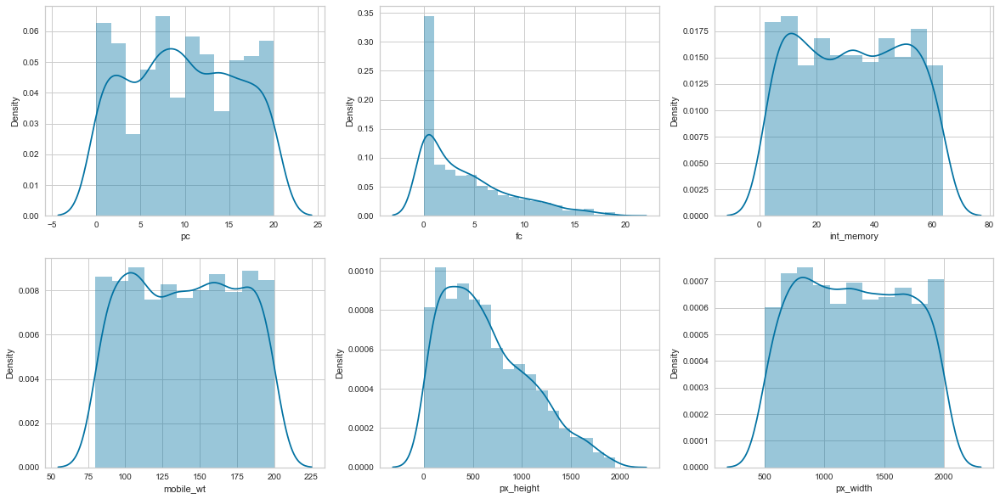

In [8]:
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 10)
sns.distplot(df_train["pc"], ax = ax[0,0]);
sns.distplot(df_train["fc"], ax = ax[0,1]);
sns.distplot(df_train["int_memory"], ax = ax[0,2]);
sns.distplot(df_train["mobile_wt"], ax = ax[1,0]);
sns.distplot(df_train["px_height"], ax = ax[1,1]);
sns.distplot(df_train["px_width"], ax = ax[1,2]);

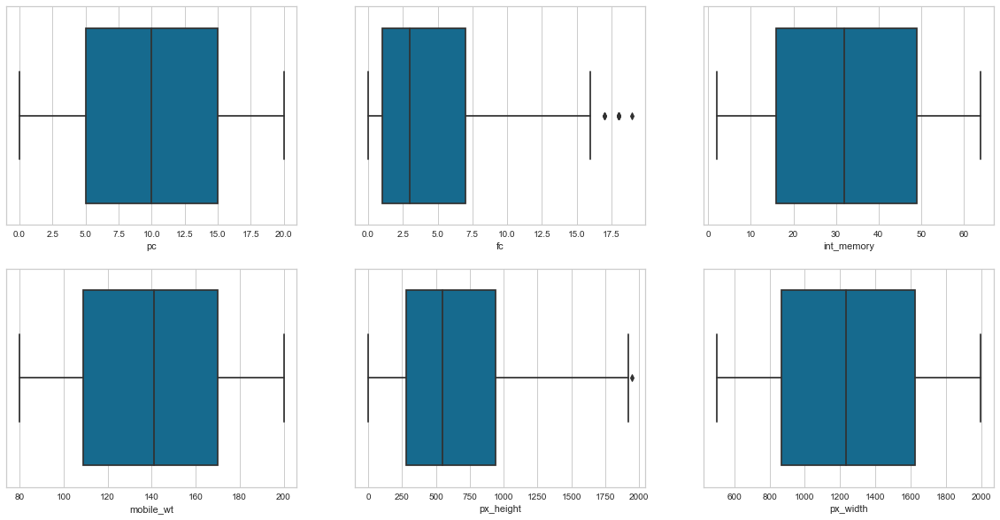

In [9]:
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 10)
sns.boxplot(df_train["pc"], ax = ax[0,0]);
sns.boxplot(df_train["fc"], ax = ax[0,1]);
sns.boxplot(df_train["int_memory"], ax = ax[0,2]);
sns.boxplot(df_train["mobile_wt"], ax = ax[1,0]);
sns.boxplot(df_train["px_height"], ax = ax[1,1]);
sns.boxplot(df_train["px_width"], ax = ax[1,2]);

***Power Type Variables***

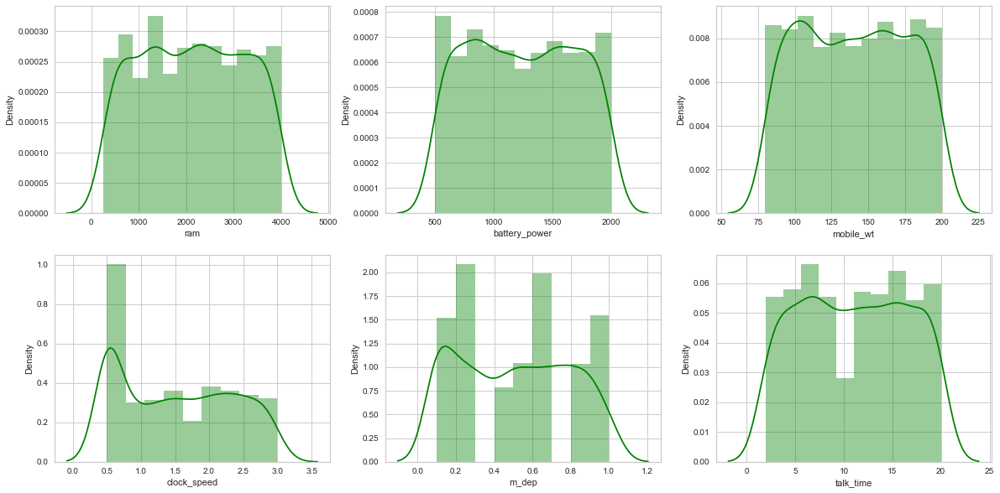

In [10]:
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 10)
sns.distplot(df_train["ram"], color='green', ax = ax[0,0]);
sns.distplot(df_train["battery_power"],color='green', ax = ax[0,1]);
sns.distplot(df_train["mobile_wt"],color='green', ax = ax[0,2]);
sns.distplot(df_train["clock_speed"], color='green', ax = ax[1,0]);
sns.distplot(df_train["m_dep"],color='green', ax = ax[1,1]);
sns.distplot(df_train["talk_time"],color='green', ax = ax[1,2]);

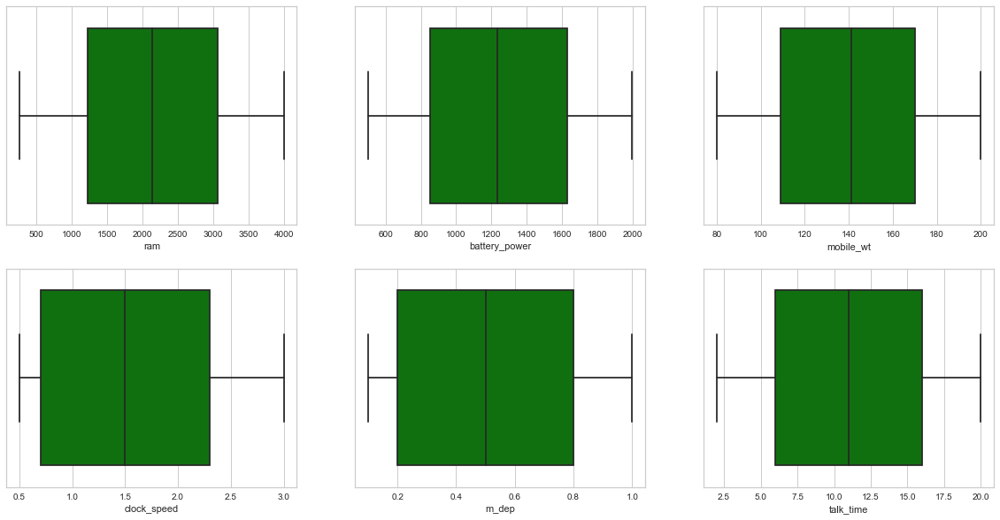

In [11]:
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 10)
sns.boxplot(df_train["ram"], color='green', ax = ax[0,0]);
sns.boxplot(df_train["battery_power"],color='green', ax = ax[0,1]);
sns.boxplot(df_train["mobile_wt"],color='green', ax = ax[0,2]);
sns.boxplot(df_train["clock_speed"], color='green', ax = ax[1,0]);
sns.boxplot(df_train["m_dep"],color='green', ax = ax[1,1]);
sns.boxplot(df_train["talk_time"],color='green', ax = ax[1,2]);

**Dispersion Evaluation**

From the different plots we can observe that the "tech" and "power" variables as we initially labeled them show a small number of outliers and a distribution without major skewness. Standarization, depending on the approach could be executed in order to improve marginally the performance of the model.

Furthermore, from the different box-plot we can observe that there are no relevant outliers in the variables at hand. To formally test this we did the following evaluation: 

In [12]:
print('Length Before Outlier Detection and Removal', len(df_train))
bef = df_train
df_train[(np.abs(stats.zscore(df_train)) < 3).all(axis=1)]
print('After removing outliers', len(df_train))
aft = df_train
print('Total Outliers removed =', (bef - aft).sum().sum())

Length Before Outlier Detection and Removal 1340
After removing outliers 1340
Total Outliers removed = 0.0


As we can observe, there are no relevant outliers to be removed from the dataset. 

### Evaluation of the variable of interest: `price_range`

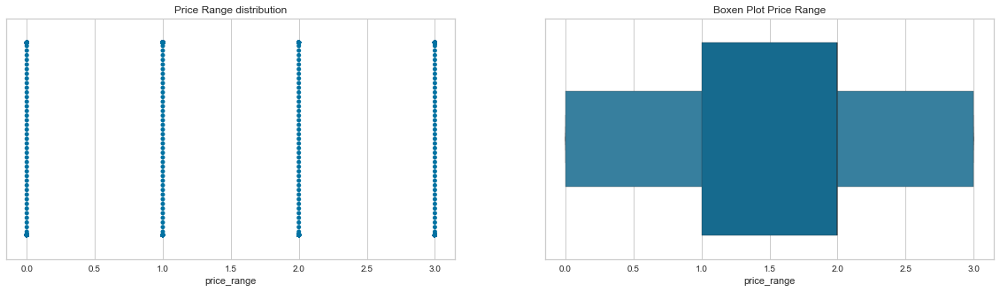

In [13]:
fig,ax = plt.subplots(1, 2)
fig.set_size_inches(20,5)
sns.swarmplot(df_train['price_range'], ax=ax[0]).set_title('Price Range distribution');
sns.boxenplot(df_train['price_range'], ax=ax[1]).set_title('Boxen Plot Price Range');


**Observation**

From the plots we can observe a correct distribution across the different price categories - hence no adjustments will be needed to avoid the model to misclassify for specfic price labels.  

---

### Correlation Analysis

To best understand the underlying relationship among the variables and degree of corrlation, we decided to build a correlation matrix. This will allow us to get a first understanding on what are important features for the model while also viewing how the correlation among the variables can be worked with. 

In [14]:
corr_matrix = df_train.corr()
corr_matrix

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.000000,0.025971,0.008297,-0.034203,0.042042,0.026848,-0.015545,0.048298,-0.018419,-0.008149,...,0.046295,0.023169,0.000349,-0.005632,-0.009470,0.040020,0.027696,-0.003751,-0.018928,0.213641
blue,0.025971,1.000000,0.019005,0.035157,-0.002862,-0.011005,0.044395,-0.007902,0.005115,0.036639,...,0.001006,-0.013405,0.013683,-0.003707,-0.010515,0.014967,-0.037206,0.007513,-0.015050,0.012093
clock_speed,0.008297,0.019005,1.000000,0.004497,0.006849,-0.075046,0.012594,-0.027834,0.033806,0.000796,...,-0.024940,-0.018890,-0.022520,-0.012528,0.000857,-0.024223,-0.058200,0.030068,-0.010147,-0.036722
dual_sim,-0.034203,0.035157,0.004497,1.000000,-0.039009,0.007689,-0.022143,-0.020904,0.017604,-0.033959,...,-0.020625,0.014628,0.045939,-0.012117,-0.013132,-0.041676,-0.011770,-0.015085,0.013805,0.019353
fc,0.042042,-0.002862,0.006849,-0.039009,1.000000,-0.021301,-0.031843,-0.021247,0.022657,0.001836,...,0.005979,0.000216,0.024353,-0.003380,-0.021235,-0.003263,0.004374,-0.010526,0.040467,0.033815
four_g,0.026848,-0.011005,-0.075046,0.007689,-0.021301,1.000000,0.005608,-0.015974,-0.000562,-0.029403,...,-0.007654,0.027702,0.013395,0.024184,0.051248,-0.026944,0.593722,0.004311,-0.035448,0.022698
int_memory,-0.015545,0.044395,0.012594,-0.022143,-0.031843,0.005608,1.000000,0.006812,-0.045670,-0.036158,...,-0.004842,-0.041810,0.040924,0.037752,0.008605,0.001846,0.005454,-0.028656,0.000035,0.044948
m_dep,0.048298,-0.007902,-0.027834,-0.020904,-0.021247,-0.015974,0.006812,1.000000,0.029124,-0.021436,...,0.039879,0.037821,-0.005013,0.005578,-0.020428,0.018600,-0.017981,-0.017194,-0.011233,0.004608
mobile_wt,-0.018419,0.005115,0.033806,0.017604,0.022657,-0.000562,-0.045670,0.029124,1.000000,0.002962,...,0.047382,0.024776,0.011486,-0.012199,-0.017359,-0.011002,-0.005969,-0.011436,-0.004661,-0.018811
n_cores,-0.008149,0.036639,0.000796,-0.033959,0.001836,-0.029403,-0.036158,-0.021436,0.002962,1.000000,...,-0.030622,0.041598,0.002934,-0.004473,0.017735,0.008946,-0.006199,0.026096,0.008603,0.009519


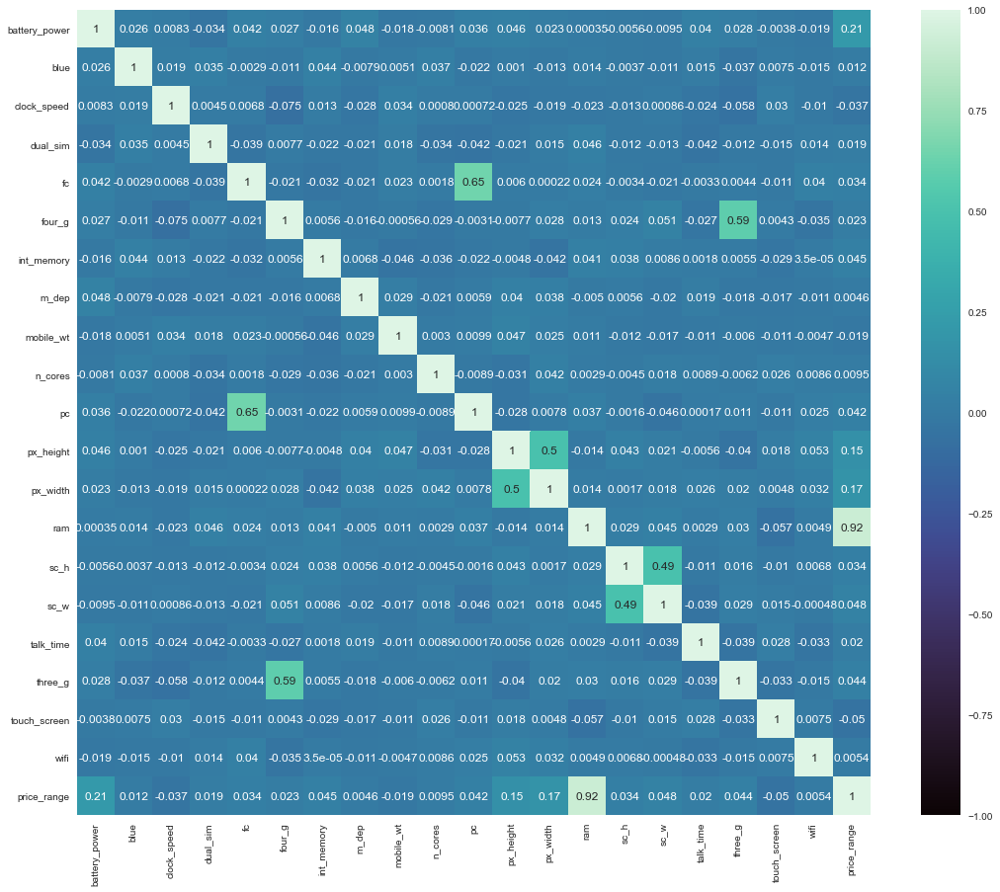

In [15]:
corr = df_train.corr()
plt.figure(figsize=(18, 15))
sns.heatmap(corr, annot=True, vmin=-1.0, cmap='mako')
plt.show()

In [16]:
# Relationship of variable of interest with other variables
corr_matrix.sort_values(by=["price_range"],ascending=False).iloc[0].sort_values(ascending=False)

price_range      1.000000
ram              0.915584
battery_power    0.213641
px_width         0.172941
px_height        0.151711
sc_w             0.048215
int_memory       0.044948
three_g          0.043548
pc               0.041643
sc_h             0.034198
fc               0.033815
four_g           0.022698
talk_time        0.020428
dual_sim         0.019353
blue             0.012093
n_cores          0.009519
wifi             0.005374
m_dep            0.004608
mobile_wt       -0.018811
clock_speed     -0.036722
touch_screen    -0.050248
Name: price_range, dtype: float64

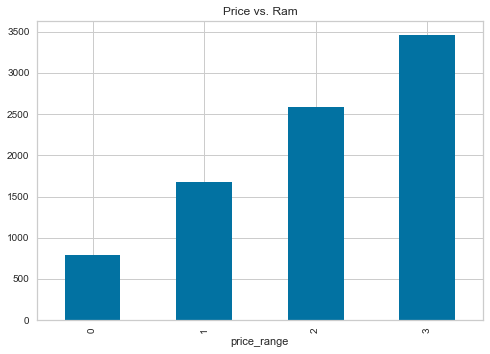

In [17]:
df_train.groupby('price_range')['ram'].mean().plot(kind = 'bar', title='Price vs. Ram');

**Correlation Observations**

From the correlation matrix the following observations can be noticed: 

- The most important feature to predict the `price_range` will be the variable `ram` which is highly correlated
- The variables `pc` and `fc` share an important correlation, which can be used to imputate the zeros
- For the zeroes of `sc_w` the variables `sc_h` (along with `four_g`, `price_range` and `ram`) can be used for zero's imputation

----

# <center>Data Preprocessing </center>

The objective in this section consists in, applying transformation in the dataset according to the insights obtained from the exploration, to obtain a complete dataset that will efficiently and effectively classify the prices accordingly. 

#### Computing zeros for sc_w

The dataset has some zeros which are logically inconsistent since - for certain rows the corresponding phone exhibits a screen width of zero and, therein after, checking if the principal camera is zero not obtaining a front camera that does is different. In other words, the phone could have a principal camera but no front camera - the other relationship does not seem reasonable. 

In [18]:
# Creating new variables for zero and non-zero
df_train_fc_0 = df_train.loc[df_train['fc']==0]
df_train_fc_not0 = df_train.loc[df_train['fc']!=0]

df_train_pc_0 = df_train.loc[df_train['pc']==0]
df_train_pc_not0 = df_train.loc[df_train['pc']!=0]

df_train_scw_0 = df_train.loc[df_train['sc_w']==0]
df_train_scw_not0 = df_train.loc[df_train['sc_w']!=0]

In [19]:
# The zero's for fc and pc are logical - hence no transformation is needed
df_train_pc_0.loc[df_train_pc_0['fc']!=0]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


**Creating a Random Forest Regresor Model to imputate the zeros**

We decided to compute the zeros for the screen width using a Random Forest Regressor due to its robustness and easy explainability on how the decision for the different predictions is reached.

In [20]:
rf_scw = RandomForestRegressor().fit(df_train_scw_not0, df_train_scw_not0['sc_w'])
df_train_scw_0['sc_w'] = rf_scw.predict(df_train_scw_0)

In [21]:
# Adding predictions for zeros
df_train = df_train_scw_0.append(df_train_scw_not0)

# Checking correct imputation
len(df_train.loc[df_train['sc_w']==0])

0

In [22]:
df_train['sc_w'].unique()

array([ 1., 11., 17.,  5.,  7.,  6.,  8., 16.,  4.,  3.,  2., 13., 10.,
        9., 12., 15., 18., 14.])

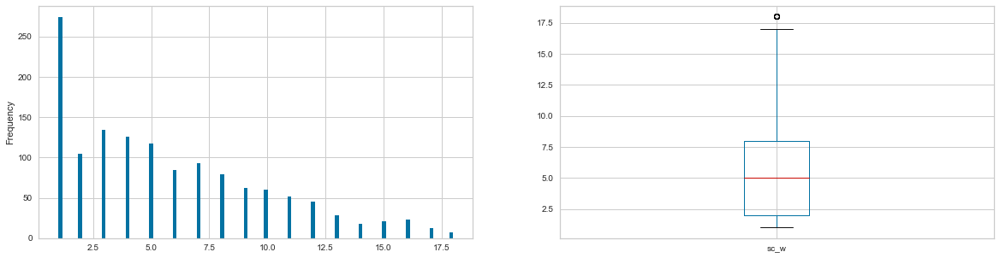

In [23]:
# Reviewing final dispersion of the variable
fig,ax = plt.subplots(1, 2)
fig.set_size_inches(20,5)
df_train['sc_w'].plot(kind = 'hist', bins=100, ax =ax[0]);
df_train['sc_w'].plot(kind = 'box', ax =ax[1]);

---

**Applying the Regression to the Test dataset**

In [24]:
df_test_scw_0 = df_test.loc[df_test['sc_w']==0]
df_test_scw_not0 = df_test.loc[df_test['sc_w']!=0]

In [25]:
rf_scw_test = RandomForestRegressor().fit(df_test_scw_not0, df_test_scw_not0['sc_w'])
df_test_scw_0['sc_w'] = rf_scw_test.predict(df_test_scw_0)

df_test = df_test_scw_0.append(df_test_scw_not0)

To compute our predictions, with our selected model, any transformation/imputation of the data must also be applied to the test dataset. Hence, we will compute this step now to avoid this imputation being lost. 

---

### Feature Creation

From the dataset we notice that some features could be combined. Particularly the variables `sc_h` and `sc_w` could be converted into a new variable: `sc_area`. Similarly, `px_height` and `px_width` could be combined to express `disp_res` (display resolution).

In [26]:
sc_area = np.multiply(df_train['sc_h'],df_train['sc_w'])
disp_res = np.multiply(df_train['px_height'], df_train['px_width'])

### Feature selection/importance with Lasso Regularization: 
Lasso regression focuses on the absolute values of the coefficients such as it forces some of the coefficient estimates to be zero when the tuning parameter is sufficiently large. We are going to analyze the components that are the most relevant to predict price_range using Lasso Regression. 

Best alpha using built-in LassoCV: 1.102390
Best score using built-in LassoCV: 0.916257
Lasso picked 5 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

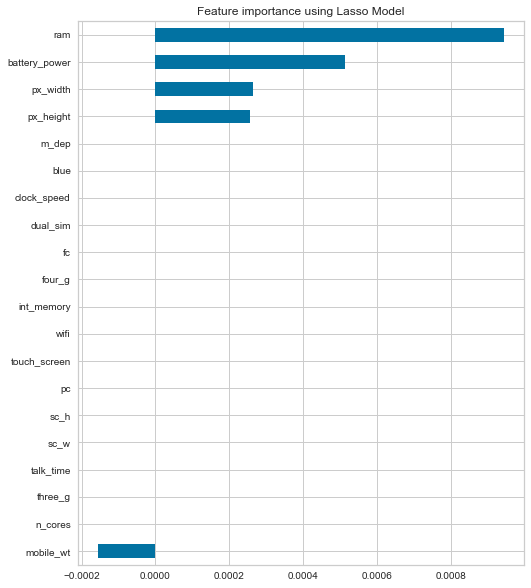

In [27]:
y = df_train['price_range'].copy()
X = df_train.drop('price_range', axis=1).copy()

reg = LassoCV()
reg.fit(X, y)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X,y))
coef = pd.Series(reg.coef_, index = X.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables")

imp_coef = coef.sort_values()
plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")

Only RAM, Battery Power, PX Height and Width are important to predict the Price Range according to Lasso Regression

### Comparing output with Random Forest Feature Importance

To see if the Lasso feature importance is consistent, we will compare the mentioned features with those indicated by a Random Forest - that provides a powerful insight and understanding on how the different variables discriminate the different classes in the dataset. 

In [28]:
# Since we are only interested in the feature selection and not the accuracy - we will not split the data
X = df_train.drop(['price_range'], axis=1)
y = df_train['price_range']

In [29]:
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X, y);

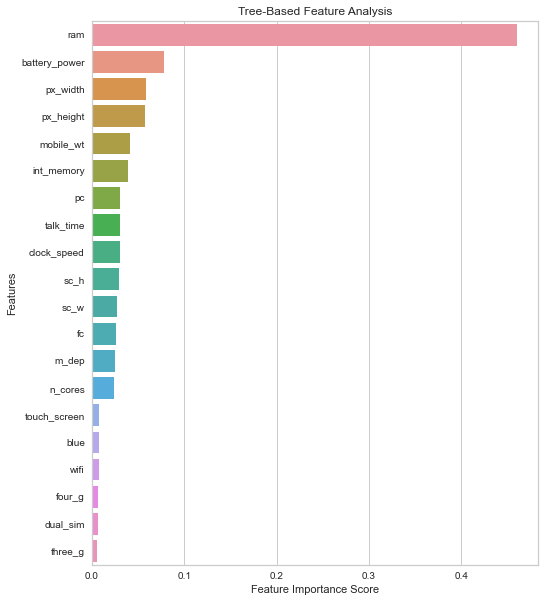

In [30]:
feature_scores = pd.Series(rfc.feature_importances_, index=X.columns).sort_values(ascending=False)
sns.barplot(x=feature_scores, y=feature_scores.index).set_title('Tree-Based Feature Analysis')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features');

In [31]:
feature_scores

ram              0.460396
battery_power    0.078280
px_width         0.058908
px_height        0.057047
mobile_wt        0.041321
int_memory       0.039659
pc               0.030361
talk_time        0.030330
clock_speed      0.030055
sc_h             0.029371
sc_w             0.027110
fc               0.025761
m_dep            0.025115
n_cores          0.024114
touch_screen     0.007751
blue             0.007409
wifi             0.007272
four_g           0.007201
dual_sim         0.006566
three_g          0.005971
dtype: float64

As we can observe - the output of the selected feature importance score is the same as the Lasso methodology

# <center>Evaluating Methodology </center>

In order to determine which is the best performing model, we decided to compute the different models studied during the course as the best approach to determine which model provides the best classification for the different mobile price range. 

The evaluation metric we will use in this case will consist of the following:

$$ Accuracy\:  Score: \frac{TP + TN}{TP + FP + FN + TN} $$

$$ Explained\:  Variance\: Score:\: 1 - \frac{Var(y - y\hat\,)}{Var(y)} $$

Finally, with all the different models computed we will select the one that provides the highest accuracy and explained variance. 

*Note: For the Neural Network Models the standard deviation of the prediction (instead of the explained variance) will be used*

# <center> Classification Models </center>

# Model 1: Random Forest Classifier


The ensemble models are one of the most important models in Machine Learning. Random Forest is a bagging methodology where by selecting a subset of features, this method is able to capture the impact of the different variables, leading towards a higher predictive power. 

There are several hyperparameters in this model that should be tuned according to the data and its characteristics. To best understand the features and their relative importance, an initial classification will be executed and, therein after improved by tuning the corresponding parameters. 

It is important to highlight that one interesting characteristic of tree-based models is that they are efficient in handling categorical variables, along with not normalized data - creating comprehensible models on the impact that a particular variable has to predict the different classes. Hence, as an initial approach in predicting the corresponding `price_range` we will use this model.

In [32]:
# Adding the created variables in the scaling of our data 
df_train_np = df_train.copy()
df_train_np['sc_area'] = sc_area
df_train_np['disp_res'] = disp_res

**Feature Selection** 

As a starting point we will use our created features and then compare them with a model without the features to see if our models prediction improves when contrasted with the model with the features included.

In [33]:
X = df_train_np.drop(['price_range','sc_w', 'sc_h', 'px_width', 'px_height'], axis=1)
y = df_train_np['price_range']

**Creating the Splits**

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

**Scaling the data**
In order to make all the different models that we will deploy comparable across the same basis, we will standarize the data as a pre-processing step for every model. 

In [35]:
scaler = StandardScaler()

In [36]:
X = scaler.fit_transform(X)

**Checking for balance in the distribution**

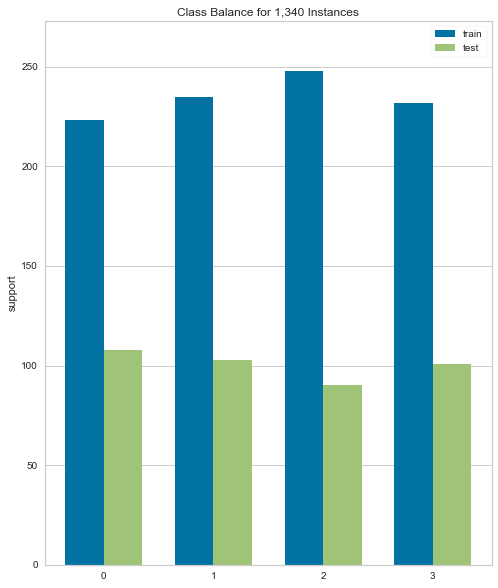

In [37]:
visualizer = ClassBalance(labels=[0, 1, 2,3])
visualizer.fit(y_train, y_test)
visualizer.poof();

From the Class Balance chart we can observe that the data is balanced for the different prices. This verification is important since, unbalanced classes would affect the accuracy metric where - if most of the train set were for example class 1, by only predicting class 1 we would get a false ilusion of accuracy in the training set but the model would not generalize well in the test set.

**Running the Model**

In [38]:
rfc = RandomForestClassifier(random_state=42) #seeding the result so train/test provide deterministic results
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)
print('Model accuracy: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))
print('Model Explained Variance: {0:0.4f}'.format(explained_variance_score(y_test, y_pred)))

Model accuracy: 0.8930
Model Explained Variance: 0.9172


**Creating a comparison Table for the different results**

To correctly assess all the models that will be tested, a comparative table will be used to select - after a rigorous testing - the best model to deploy our predictions.

In [39]:
results = pd.DataFrame(columns=['Approach', 'Accuracy', 'Explained Variance'])

In [40]:
results.loc[len(results)]= ['Random Forest Classifier - new parameters', accuracy_score(y_test, y_pred), explained_variance_score(y_test, y_pred)]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189


### Tuning the Random Forest Regression

The Random Forest library in sklearn provides several parameters that can be fine-tuned to best adjust the underlying predictive power of the variables and provide more weight on aspects that will help to correclty assign the different phones to their correct price category. 

In this section we will also evaluate if, reducing the number of features by including the created variables improve the predictions in the model, test different splitting criterias (entropy - which measures information gain - vs. gini - impurity), among other criterias (maximum number of trees, maximum number of features, minimum number of samples required to split an internal node).

In [41]:
param_grid = { 
    'n_estimators': [100, 200, 400, 500, 700], # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'], # Different measures of m features to use / default: auto = sqrt
    'max_depth' : [4,5,6,7,8,10,12], # Maximum depth for the tree - default: None
    'criterion' :['gini', 'entropy'], # Measurment of quality of the split
    'oob_score': [True, False] # Using out-of-bag samples for generalization 
}

In [42]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)

rfc_np = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= cv, verbose=1, n_jobs=-1) #n_jobs to run faster
rfc_np.fit(X_train, y_train)

y_pred_npcv = rfc_np.predict(X_test)

Fitting 15 folds for each of 420 candidates, totalling 6300 fits


**Note**

To improve the sharing/testing dynamic we decided to add pickles for the most computationally intense models - to allow for a access on the build-up of the model. This allowed us to work faster as a team and also, avoid losing time computing repeatedly the same models when sharing the analysis. 

In [43]:
# Cleans previous pickle
with open('../Machine Learning II/rfc_np.pkl', 'wb') as f:
    pickle.dump(rfc_np, f)

In [44]:
# Loads saved pickle
with open('../Machine Learning II/rfc_np.pkl','rb') as f:
    loaded_model = pickle.load(f)

rfc_npcv = loaded_model

**Observation**

We decided to use a RepeatedStratifiedKFold since by using this cross-validation method (an extension of the cross-validation technique used for classification problems which maintains the same class ratio throughout the K folds as the ratio in the original dataset) we force the model to maintain class balances. While this is not an issue for our dataset, it will apply the same process as a regular KFold while also attaining the small differences that exist between classes. 

In [45]:
y_pred_npcv = rfc_np.predict(X_test)
print('Model accuracy: {0:0.4f}'.format(accuracy_score(y_test, y_pred_npcv)))
print('Model Explained Variance: {0:0.4f}'.format(explained_variance_score(y_test, y_pred_npcv)))

Model accuracy: 0.8930
Model Explained Variance: 0.9170


In [46]:
results.loc[len(results)]= ['Random Forest Classifier - new parameters GridSearchCV', accuracy_score(y_test, y_pred), explained_variance_score(y_test, y_pred)]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189


**<center>Conclusion Model 1 </center>**

The new parameters provide a way of combining the different explanatory variables available and reduce the number of features that the model must evaluate at the moment of making the different splits. To determine whether this approach is the best approach we will compare the results with a simpler model that only focuses on the feature importance identified previously. As we can see, the accuracy of the model does not change with the selected parameter tuning. 

### Random Forest Model II: A simplified feature version

In [47]:
# Selecting the top identified features and splitting the dataset

X = df_train[['ram', 'battery_power', 'px_width', 'px_height', 'mobile_wt']]
y = df_train['price_range']

X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [48]:
# Defining our model
rfc = RandomForestClassifier(random_state=42)

In [49]:
# Parameters to tune the model (same as for the previous one): 

param_grid = { 
    'n_estimators': [100, 200, 400, 500, 700], # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'], # Different measures of m features to use / default: auto = sqrt
    'max_depth' : [4,5,6,7,8,10,12], # Maximum depth for the tree - default: None
    'criterion' :['gini', 'entropy'], # Measurment of quality of the split
    'oob_score': [True, False] # Using out-of-bag samples for generalization 
}


In [50]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= cv, verbose=1, n_jobs=-1)
CV_rfc.fit(X_train, y_train)

Fitting 15 folds for each of 420 candidates, totalling 6300 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=42),
             estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8, 10, 12],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 400, 500, 700],
                         'oob_score': [True, False]},
             verbose=1)

In [51]:
y_predcv = CV_rfc.predict(X_test)
print('Model accuracy: {0:0.4f}'.format(accuracy_score(y_test, y_predcv)))
print('Model Explained Variance: {0:0.4f}'.format(explained_variance_score(y_test, y_predcv)))

Model accuracy: 0.9129
Model Explained Variance: 0.9330


In [52]:
# Creating Pickle
with open('../Machine Learning II/CV_rfc.pkl', 'wb') as f:
    pickle.dump(CV_rfc, f)

In [53]:
# Open saved Pickle
with open('../Machine Learning II/CV_rfc.pkl','rb') as f:
    loaded_model = pickle.load(f)

CV_rfc = loaded_model

In [54]:
print(CV_rfc.best_params_)

{'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'n_estimators': 700, 'oob_score': True}


In [55]:
results.loc[len(results)] = ['Random Forest with GridSearchCV', accuracy_score(y_test, y_predcv), 
                             explained_variance_score(y_test, y_predcv)]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014


### <center>Conclusion Random Forest</center>

By sub-selecting a number of features and tuning the parameters (while applying a cross-validation method) we were capable of increasing the initial 85% accuracy of the model to a 92% - a more than promising result. While removing features is counter-intuitive in a random forest, since the model seeks to de-correlate trees by averaging the error from the different subset of features and trees, by understanding how the target variable is related with the independent variables, we are able to force the splitting focusing on a smaller amount of features that have a larger discriminant power and hence obtain better results.

---

# <center>Model 2: XGBoost</center>

Gradient boosting is a powerful technique within the ensemble methodology which produces a prediction in a model in the form of an ensemble of weak prediction trees to produce a stronger prediction in an iterative process. This boosting process seeks to reduce bias and variance. 

This model, as any gradient descent method, cannot handle categorical variables - requiring as a result a feature transformation to enable the model to incorporate these features in its optimization process. Other than that, the model does not require any other feature transformation - such as scaling, or imputation of missing values. 

The main challenge with this model consists in tuning the parameters correctly - as the model tends to overfit the data if not correctly parametrized. 

In [56]:
X = df_train.drop(['price_range'], axis=1)
y = df_train['price_range']

In [57]:
X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

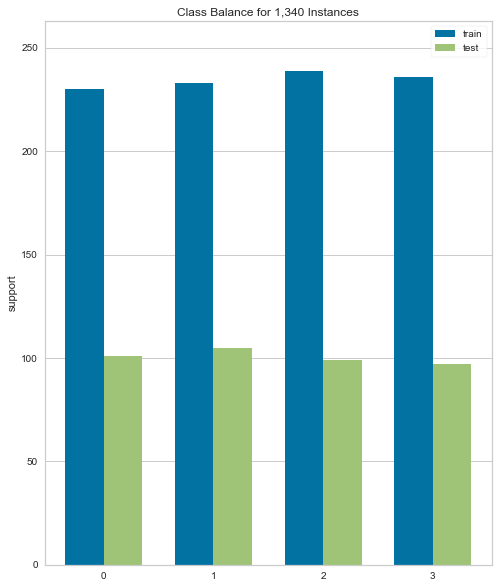

In [58]:
visualizer = ClassBalance(labels=[0, 1, 2,3])
visualizer.fit(y_train, y_test)
visualizer.poof();

The split created for this new model looks balanced across the different categories, so we can proceed with the first computation of the model:

In [59]:
xgb_tree = XGBClassifier(random_state=42)
xgb_tree.fit(X_train, y_train, eval_metric='mlogloss')

predictions = xgb_tree.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,xgb_tree.predict(X_test))))
print('Model Explained Variance: {0:0.4f}'.format(explained_variance_score(y_test, xgb_tree.predict(X_test))))

Accuracy = 0.8955
Model Explained Variance: 0.9159


In [60]:
results.loc[len(results)] = ['XGBoost with dummy variables', accuracy_score(y_test,xgb_tree.predict(X_test)), 
                             explained_variance_score(y_test, xgb_tree.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875


This gave us an accuracy of 90%, which is lower than the Random Forest with GridSearch. 
Now we will perform XGBoost with parameter tuning so we can chose a set of optimal hyperparameters and see how we can improve the accuracy

In [61]:
params = {
    "colsample_bytree": uniform(0.7, 0.3), # Denotes the fraction of columns to be randomly samples for each tree
    "gamma": uniform(0, 0.5), # Minimum loss reduction to make the split
    "learning_rate": uniform(0.05, 0.3), # Most problems are covered by this learning rate 
    "max_depth": [3, 5, 7, 10], # The maximum level of splits from where the model prunes backwards in terms of info. gain
    "n_estimators": randint(200, 1000), # Number of boosting rounds 
    "subsample": uniform(0.5, 0.9) # Start value - typical values are 0.5-0.9
}

In [62]:
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=5, random_state=42)

search = RandomizedSearchCV(xgb_tree, param_distributions=params, random_state=42, n_iter=200, cv=cv, 
                            verbose=1, n_jobs=-1, return_train_score=True)

search.fit(X_train, y_train)

Fitting 15 folds for each of 200 candidates, totalling 3000 fits
[17:02:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=5, n_splits=3, random_state=42),
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           gpu_id=-1, importance_type='gain',
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=...
                                        'gamma': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000269304A17F0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026934BF76A0>,
         

In [64]:
# Creating Pickle
with open('../Machine Learning II/search_xg.pkl', 'wb') as f:
    pickle.dump(search, f)

In [65]:
# Open saved pickle
with open('../Machine Learning II/search_xg.pkl','rb') as f:
    loaded_model = pickle.load(f)

search_xg = loaded_model

In [66]:
predictions = search.best_estimator_.predict(X_test)

print(search.best_estimator_)
print("Accuracy = {0:.4f}".format(accuracy_score(y_test,search.best_estimator_.predict(X_test))))
print('Explained Variance: {0:0.4f}'.format(explained_variance_score(y_test,search.best_estimator_.predict(X_test))))

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9732058594767139,
              gamma=0.0614053909228669, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.12077181037852436,
              max_delta_step=0, max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=821, n_jobs=8,
              num_parallel_tree=1, objective='multi:softprob', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=0.6676887915447086, tree_method='exact',
              validate_parameters=1, verbosity=None)
Accuracy = 0.8930
Explained Variance: 0.9140


In [67]:
results.loc[len(results)] = ['XGBoost with dummy variables, GridSearchCV', accuracy_score(y_test,search.best_estimator_.predict(X_test)),
                            explained_variance_score(y_test,search.best_estimator_.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965


Parameter tuning on XGBoost did not improve the accuracy significantly

**Observation**

Without tuning the model - we are able to obtain a 89% accuracy on this model. Similarly to Random Forest, this method provides a quick way of creating predictions with an elevated accuracy. Furthermore, we are able to observe that in both models - the feature top-5 ranking is the same. So, in an attempto to improve the performance we will look into the different parameters and try and adjust them to the data we are dealing with by using a `RandomizedSearch` for the different variables


### Model II XGBoost: a tuned version

In [68]:
X = df_train.drop(['price_range'], axis=1)
y = df_train['price_range']


X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [69]:
# We will use the tree gradient boosting - rather than the linear model due to performance

params = {
    "colsample_bytree": uniform(0.7, 0.3), # Denotes the fraction of columns to be randomly samples for each tree
    "gamma": uniform(0, 0.5), # Minimum loss reduction to make the split
    "learning_rate": uniform(0.05, 0.3), # Most problems are covered by this learning rate 
    "max_depth": [3, 5, 7, 10], # The maximum level of splits from where the model prunes backwards in terms of info. gain
    "n_estimators": randint(200, 1000), # Number of boosting rounds 
    "subsample": uniform(0.5, 0.9) # Start value - typical values are 0.5-0.9
}



In [71]:
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=5, random_state=42)

search = RandomizedSearchCV(xgb_tree, param_distributions=params, random_state=42, n_iter=200, cv=cv, verbose=1, n_jobs=-1, return_train_score=True)
search.fit(X_train, y_train)

Fitting 15 folds for each of 200 candidates, totalling 3000 fits
[18:01:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=5, n_splits=3, random_state=42),
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           gpu_id=-1, importance_type='gain',
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=...
                                        'gamma': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026934226FA0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026931660580>,
         

In [72]:
predictions = search.best_estimator_.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,search.best_estimator_.predict(X_test))))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test,search.best_estimator_.predict(X_test))))

Accuracy = 0.8831
Explained Variance = 0.9065


In [73]:
# Creating Pickle
with open('../Machine Learning II/search_xg2.pkl', 'wb') as f:
    pickle.dump(search, f)

In [74]:
# Open saved pickle
with open('../Machine Learning II/search_xg2.pkl','rb') as f:
    loaded_model = pickle.load(f)

search_xg2 = loaded_model

In [75]:
results.loc[len(results)] = ['XGBoost without categorical, GridSearchCV', accuracy_score(y_test,search.best_estimator_.predict(X_test)),
                            explained_variance_score(y_test,search.best_estimator_.predict(X_test))]

results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465


In this case, reducing the number of features leads to a lower accuracy in the model since, the algorithm has less amount of variables to determine the path to optimize. 
The model was not improved - to compare the perfomance with the best one obtained with the Random Forest, the top 4 explanatory features will be used (filtered with L1) and the model tuned using the same parameter grid as before

In [76]:
X = df_train[['ram', 'battery_power', 'px_width', 'px_height']]
y = df_train['price_range']

X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [77]:
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=5, random_state=42)

search = RandomizedSearchCV(xgb_tree, param_distributions=params, random_state=42, n_iter=200, cv=cv, verbose=1, n_jobs=-1, return_train_score=True)
search.fit(X_train, y_train)

Fitting 15 folds for each of 200 candidates, totalling 3000 fits
[18:15:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=5, n_splits=3, random_state=42),
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           gpu_id=-1, importance_type='gain',
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_delta_step=0, max_depth=6,
                                           min_child_weight=1, missing=...
                                        'gamma': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026934226FA0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026931660580>,
         

In [78]:
# Creating Pickle
with open('../Machine Learning II/search_xg3.pkl', 'wb') as f:
    pickle.dump(search, f)

In [79]:
# Open saved pickle
with open('../Machine Learning II/search_xg3.pkl','rb') as f:
    loaded_model = pickle.load(f)

search_xg3 = loaded_model

In [80]:
predictions = search.best_estimator_.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,search.best_estimator_.predict(X_test))))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test,search.best_estimator_.predict(X_test))))

Accuracy = 0.9204
Explained Variance = 0.9376


In [81]:
results.loc[len(results)] = ['XGBoost with l1 selection, GridSearchCV', accuracy_score(y_test,search.best_estimator_.predict(X_test)),
                            explained_variance_score(y_test,search.best_estimator_.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559


###  <center>XGBoost Conclusion:</center>

The model provides a powerful solution with a high accuracy (but still lower accuracy than the one we obtained with RandomForest), along with an easy implementation - the understanding on how the different hyperparameters affect the model and could overfit is a crucial aspect in this model and, for such reason, we decided to use a randomized search to cover the general use-cases for this type of model. 


# <center>Model 3: SVM</center>

The Support Vector Machine algorithm has at its core objective maximizing the "large margin". In other words, this model seeks to create an effective classification by fitting the data into the corresponding classes and then establishing a threshold that will separate the classes as much as possible in order for the model to generalize better when set in production. 

The way the model operates is by use of support vectors - points closer to the hyperplane which determine the shape of the different classes - which establish by casting a "shadow" from the different parameter vector orthogonals to the decision boundry the model. The larger the distance between the support vectors of the different groups, the larger the margin classifier, and hence the lower the classification error. SVM models have the option of including kernels to project the data-points to be classified into different dimensions, which is useful when a linear solution for the problem is initially not possible.

The way the model functions, mathematically is via the optimization of its cost function:

$$ min_{\Theta} C  \left[ \sum^{n} y^{i} cost_{1}(\Theta^{T} x^{i}) + (1-y^{i})Cost_{0}(\Theta^{T}x^{i})\right] + \frac{1}{2} \sum^{n} \Theta^{2} $$

In other words, what the previous equation is an adaptation of the cost function of the Logistic Regression model, where the main difference is on how the regularization parameter: $$ \frac{1}{2} \sum^{n} \Theta^{2} $$ 

varies in terms of the C (known as $\lambda$ in the logistic regression cost function) which is multiplying the training errors. 

So, for lower values of C, the model will be regularizing more - and with higher values the model will be penalizing more the training errors.  

### Data Preparation

SVM models are heavily dependent on having standarized data in order for them to better differentiate among the different categories and correctly apply the measures of distance. On this note, it is also important to remark that the model does not work linearly with categorical variables - since they cannot be measured correctly. 



In [82]:
X = df_train.drop(['price_range','blue', 'dual_sim', 'three_g', 'four_g', 'touch_screen', 'wifi'], axis=1)
y = df_train['price_range']

X= scaler.fit_transform(X)

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

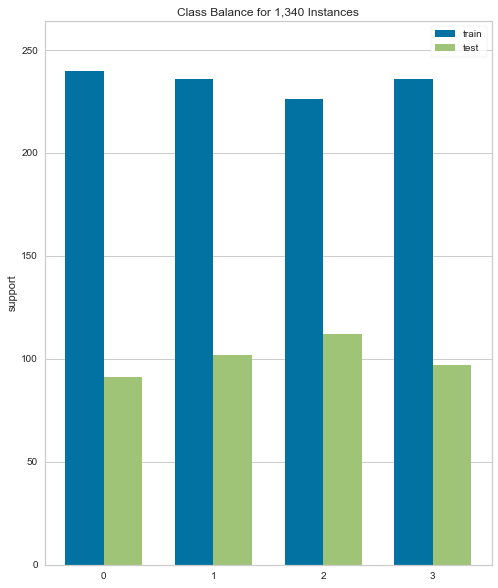

In [84]:
visualizer = ClassBalance(labels=[0, 1, 2,3])
visualizer.fit(y_train, y_test)
visualizer.poof();

**First Measure of SVM**

To contrast the tuned model we will first observe how the data is fit in the model and, then select different values of C, and other parameters, to find the best combination of features to maximize the final accuracy obtained by this model.

In [85]:
svm_mod = SVC(random_state=42).fit(X_train,y_train)

In [86]:
predictions = svm_mod.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,svm_mod.predict(X_test))))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test,svm_mod.predict(X_test))))

Accuracy = 0.8881
Explained Variance = 0.9055


In [87]:
results.loc[len(results)] = ['SVM', accuracy_score(y_test,svm_mod.predict(X_test)), 
                            explained_variance_score(y_test,svm_mod.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470


**Visualizing the Support Vectors**

To understand the model and how it will generalize in production a good approach is understanding how the support vectors are working.

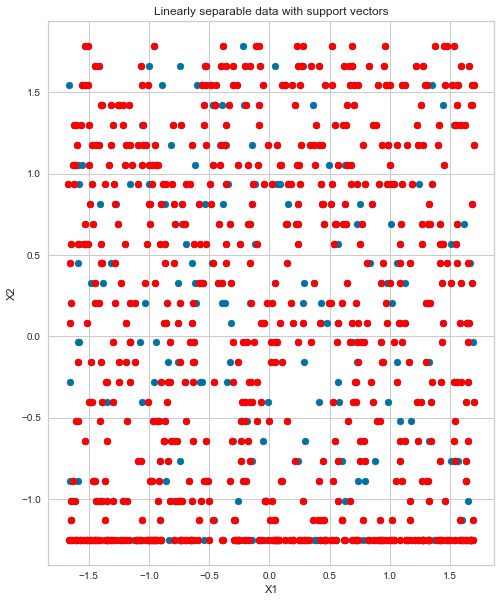

In [88]:
# Get support vectors themselves
support_vectors = svm_mod.support_vectors_

# Visualize support vectors
plt.scatter(X_train[:,0], X_train[:,1])
plt.scatter(support_vectors[:,0], support_vectors[:,1], color='red')
plt.title('Linearly separable data with support vectors')
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

In [89]:
len(support_vectors)

759

A first impression indicates that the model is overfitting the data - so an intense tuning and regularization will be necessary for this model to perform better in production and better represent the structure of the data to make the corresponding classification.
While tuning the SVM we will look at 3 parameters: 
gamma: decides that how much curvature we want in a decision boundary. A high Gamma value means more curvature
C: C is the regularization parameter. A large C gives you low bias and high variance
Kernel: Specifies the kernel type to be used in the algorithm



### Model II SVM: A Tuned Version

In [90]:
X = df_train.drop(['price_range','blue', 'dual_sim', 'three_g', 'four_g', 'touch_screen', 'wifi'], axis=1)
y = df_train['price_range']

X= scaler.fit_transform(X)

svm_model=SVC(kernel='rbf', decision_function_shape='ovr', probability=True, random_state=42)
svm_model.fit(X_train, y_train)

print("Accuracy Score:", accuracy_score(y_test, svm_model.predict(X_test)))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test, svm_model.predict(X_test))))


Accuracy Score: 0.8880597014925373
Explained Variance = 0.9055


In [91]:
X = df_train.drop(['price_range','blue', 'dual_sim', 'three_g', 'four_g', 'touch_screen', 'wifi'], axis=1)
y = df_train['price_range']


svm_parameters = {'gamma': [0.01,0.1,1,10],'C':[0.01,0.1,1,10], 'kernel':['linear', 'poly', 'rbf']}
grid_svm = GridSearchCV(svm_model, svm_parameters,cv=4,scoring='accuracy')

grid_svm.fit(X_train, y_train)

print(grid_svm.best_estimator_)
print("Accuracy Score:", accuracy_score(y_test, grid_svm.predict(X_test)))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test, svm_model.predict(X_test))))

print("best score: ", grid_svm.best_score_)


SVC(C=10, gamma=0.01, kernel='linear', probability=True, random_state=42)
Accuracy Score: 0.9701492537313433
Explained Variance = 0.9055
best score:  0.9520276413893436


In [92]:
results.loc[len(results)] = ['SVM with GridSearchCV', accuracy_score(y_test, grid_svm.predict(X_test)), 
                            explained_variance_score(y_test, svm_model.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470


### <center>Conclusion SVM</center>

While optimizing the parameters of the SVM , we reached a high accuracy of 95%.
This solution proposed to use a linear kernel, which means that data is linearly separable. 
SVM is an efficient model for classification problems for balanced datasets (as this one). SVM works relatively well when there is a clear margin of separation between classes.

# <center>Model 4: K-Nearest Neighbors</center>

The KNN model is part of the supervised machine learning algorithm that can be used for both classification and regression problems. The algorithm works by assuming that similar objects will exist close to each other and by applying a measure of distance (minkowski,cosine, euclidean, or other). Hence by applying feature similarity, this model labels different objects according to the resemblance to the training set data. 

As it is a lazy learning algorithm since it doesn't have a specialized training phase. Rather, it uses all of the data for training while classifying a new data point or instance, we won't modify or eliminate any of the features in the original dataset.

We start with the default number of neighbors, which allows us to set a score baseline for hyper parameter tuning

In [93]:
y = df_train['price_range'].copy()
X = df_train.drop('price_range', axis=1).copy()

X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [94]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
print("Accuracy Score:", accuracy_score(y_test, knn.predict(X_test)))
print("Explained Variance:", explained_variance_score(y_test, knn.predict(X_test)))

Accuracy Score: 0.4925373134328358
Explained Variance: 0.4492784488386199


In [95]:
results.loc[len(results)] = ['KNN', accuracy_score(knn.predict(X_test),y_test), 
                             explained_variance_score(knn.predict(X_test),y_test)]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470
9,KNN,0.492537,0.297543


We see that this model, in it's most basic approach, gives us a 90% accuracy. This is a pretty good result, but we'll use Cross Validation to fine tune the hyperparameters in order to enhance the model.

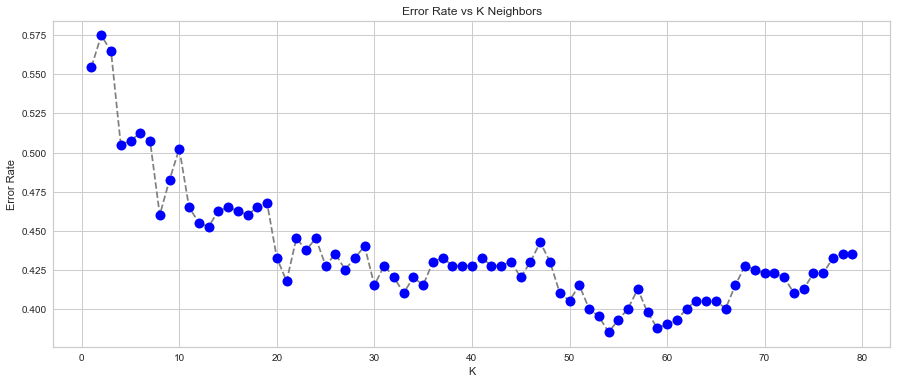

In [96]:
error_rate = []

for i in range(1,80):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))
    
plt.figure(figsize = (15,6))
plt.plot(range(1,80),error_rate, color = 'grey', linestyle = 'dashed', marker = 'o',
        markerfacecolor = 'blue', markersize =10)
plt.title('Error Rate vs K Neighbors')
plt.xlabel('K')
plt.ylabel('Error Rate');

We can also see, that error is minimized at K = ~10 neighbors.

We also notice that after K = 20, the error rate goes up and gets a local max at ~70.

We take this into consideration when looking for optimal hyperaparameters.

In [97]:
grid_params_knn = [{'clf__n_neighbors': [5,10,15,20],
        'clf__algorithm': ['auto','ball_tree','brute'],
        'clf__leaf_size': [10,30,50],
        'clf__p': [2],
        'clf__metric': ['minkowski', 'euclidean'],
        'clf__weights': ['uniform']}]

Grid object is ready to do 10-fold cross validation on a KNN model using classification accuracy as the evaluation metric.In addition, there is a parameter grid to repeat the 10-fold cross validation process 30 times. Each time, the n_neighbors parameter should be given a different value from the list, we don't use the ones in the graph, to keep the model more general. We have to specify n_neighbors should take on 1 through 30.

In [98]:
# We decided to use pipelines to test this method for this model
pipe_knn = Pipeline([('clf', KNeighborsClassifier())])
n_jobs = -1

gs_knn = GridSearchCV(estimator=pipe_knn,
            param_grid=grid_params_knn,
            scoring='accuracy',
            cv=10,
            n_jobs=n_jobs)

# Fit grid search
gs_knn.fit(X_train, y_train)
# Best params
print('Best params: %s' % gs_knn.best_params_)
# Best training data accuracy
print('Best training accuracy: %.3f' % gs_knn.best_score_)

Best params: {'clf__algorithm': 'auto', 'clf__leaf_size': 10, 'clf__metric': 'minkowski', 'clf__n_neighbors': 20, 'clf__p': 2, 'clf__weights': 'uniform'}
Best training accuracy: 0.541


In [99]:
print("Accuracy Score:", accuracy_score(y_test, gs_knn.predict(X_test)))
print("Explained Variance:", explained_variance_score(y_test, gs_knn.predict(X_test)))

Accuracy Score: 0.5671641791044776
Explained Variance: 0.6129457899098583


In [100]:
results.loc[len(results)] = ['KNN with GridSearchCV', accuracy_score(y_test, gs_knn.predict(X_test)),
                            explained_variance_score(y_test, gs_knn.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470
9,KNN,0.492537,0.297543


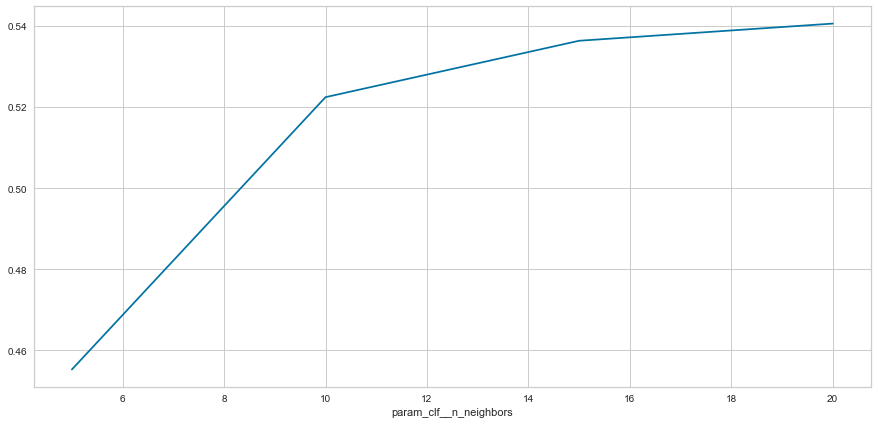

In [101]:
knn_df = pd.DataFrame(gs_knn.cv_results_)
# plot data
fig, ax = plt.subplots(figsize=(15,7))
knn_df.groupby(['param_clf__n_neighbors']).mean()['mean_test_score'].plot(ax=ax);

###  <center>Conclusion KNNeighbors</center>

We improved the best training accuracy by optimizing and reducing the number of leafs and neighbors that the model uses to fit the data. 

This reduces computational power, reduces result speed, and also improves overall the behaviour of the model (compared with its previous version) where we are using the optimized model uses a K = ~15 neighbors to minimize the error rate. 

We conclude that this model is useful for quick computations when the dataset is simple enough and a clear distinctions between the classes can be created - such that this model can discrimiante and provide good predictions. In this case, the overall accuracy and explained variance by the model provides a low result indicating that most of the features in the dataset do not create distinction between the different clases, leading to a poor performance of this model (in contrast with the other methods).

# <center>Model 5: Logistic Multinomial Regression</center>

The data we are intending to classify consists of different price categories. Due to this characteristic, the logistic multinomial regression model applies a generalization of the logistic regression model for multi-class problems. This model is particularly effective when the dependent variable is a categorical one (as is our case).

The model, requires an overall low collinearity and relies on the assumption of independence of irrelevant alternatives - in other words, the odds of preferring one class over another will not be affected by irrelevant alternatives -. The cost function that the model seeks to optimize (cross entropy loss) takes the following format:

$$ J(\Theta) = -\frac{1}{m} \left[\sum^{m} y^{(i)} log (h_\Theta (x^{(i)}) + (1 - y^{(i)}) log (1 - h_\Theta (x^{(i)}))\right] $$


The loss function maximizes the probability of the scoring vectors to the target variable. The main difference with the Logistic Regression model is that the model no longer uses a Sigmoid function - as the problem is not binary - and a Softmax function is used instead. Consequently, since the activation function of the model is different in this case, the loss function applied is adjusted from the Logistic Regression model. 

Finally, the multinomial regression model applies a stochastic gradient descent approach to the classification problem - instead of a regular gradient descent that is used for Logistic Regression problems - due to the many features in the data.


In [102]:
y = df_train['price_range'].copy()
X = df_train.drop('price_range', axis=1).copy()

X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Accuracy = 0.9254


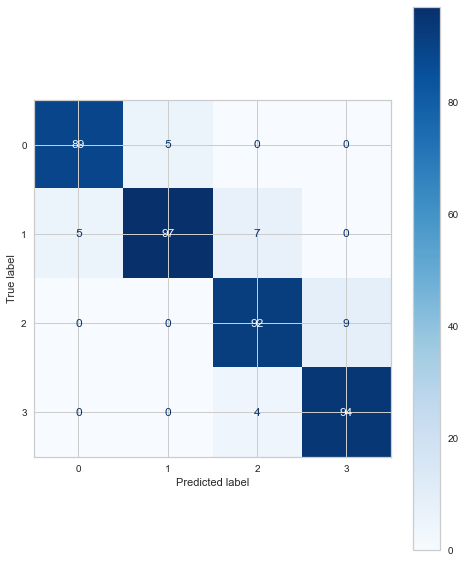

In [103]:
logreg = LogisticRegression(max_iter=100, multi_class='multinomial', random_state=42)
logreg.fit(X_train,y_train)
predictions = logreg.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,logreg.predict(X_test))))
plot_confusion_matrix(logreg, X_test, y_test, cmap=plt.cm.Blues);

In [104]:
results.loc[len(results)] = ['Logistic Regression', accuracy_score(y_test,logreg.predict(X_test)),
                            explained_variance_score(y_test,logreg.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470
9,KNN,0.492537,0.297543


While runing a simple Logistic Regression, we got an excellent accuracy resutl. We will try and improve this by tuning the parametes of the model to better adjust to the data and objective at hand.

In [105]:
log_params={"C":np.logspace(-4,4,20), "penalty":["l1","l2", "none"], "solver":['lbfgs', 'liblinear']}
grid_log = GridSearchCV(logreg, 
                   log_params,
                   scoring='accuracy',
                   cv=10 , n_jobs=1, verbose=1)
grid_log.fit(X_train,y_train)
print("best param: ", grid_log.best_params_)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
best param:  {'C': 206.913808111479, 'penalty': 'l2', 'solver': 'lbfgs'}


In [106]:
logreg2 = LogisticRegression(C= 206.913808111479, penalty='l2', multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
logreg2.fit(X_train,y_train)
predictions = logreg2.predict(X_test)

print("Accuracy = {0:.4f}".format(accuracy_score(y_test,logreg2.predict(X_test))))
print("Explained Variance = {0:.4f}".format(explained_variance_score(y_test,logreg2.predict(X_test))))

Accuracy = 0.9577
Explained Variance = 0.9652


In [107]:
results.loc[len(results)] = ['Logistic Regression with GridSearchCV', accuracy_score(y_test,logreg2.predict(X_test)),
                            explained_variance_score(y_test,logreg2.predict(X_test))]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470
9,KNN,0.492537,0.297543


### <center>Conclusion Logistic Regression</center>

Logistic regression is easier to implement, interpret, and very efficient to train. While looking at the weight of the coefficients we can also understand the feature importance. 
We got a very high accuracy with this model. As we saw in SVM, the optimal solution was using a linear kernel. Logistic Regression is an algorithm that performs very well when the dataset is linearly separable (as it is the case).

While tuning the Logistic Regression with C (inverse of regularization strength) and penalty(type of regularization), we got the best accuracy until now. 

# <center>Model 6: Neural Network</center> 

As we were able to observe through different Kaggle winning models, and as was also mentioned in class, in competitions Neural Network Models tend to be the best models since they are able to outperform by a small margin other models. Consequently, as this assignment has a heavy competitive side with other groups, we decided to embark ourselves in building a neural network to make the corresponding classifications.

As we know, Neural Networks are some of the most complex algorithms that we can use to solve a Machine Learning problem. We have know quite a bit of knowledge regarding the complexity (or lack thereof) of this dataset, so it is not practical at all to run a NN for this example, but we want to explore the capabilities of the algorithms for basic problems such as this one. 

As we have done with all models, we'll create a baseline for the most basic model, without hyperparameter tuning, so that we can measure the effects of improving the model by messing up with the numbers, thresholds and so forth.

We first need to preprocess some of the data, as some of the algorithms don't accept incorrectly formatted data.

We won't split the data in this example, as we want to measure the impact of Cross Validating

In [108]:
y = df_train['price_range'].copy()
X = df_train.drop('price_range', axis=1).copy()

X= scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Initializing the model

In [109]:
modelNN = MLPClassifier(random_state=42)

In [110]:
param_grid_NN = {'learning_rate': ['constant','adaptive','invscaling'],
                'activation':['identity','logistic','tanh','relu'],
                'solver':['adam','sgd','lbfgs'],
                'hidden_layer_sizes':[3,10,20,50,100]
                    }

In [111]:
# Exhaustive search through the HP space

NN_grid = GridSearchCV(estimator = modelNN,
                      param_grid = param_grid_NN,
                      cv = 5,
                      verbose = -2,
                      n_jobs = -1,
                      scoring = 'accuracy')
NN_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(random_state=42), n_jobs=-1,
             param_grid={'activation': ['identity', 'logistic', 'tanh', 'relu'],
                         'hidden_layer_sizes': [3, 10, 20, 50, 100],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'solver': ['adam', 'sgd', 'lbfgs']},
             scoring='accuracy', verbose=-2)

In [112]:
NN_random = RandomizedSearchCV(estimator = modelNN,
                              param_distributions = param_grid_NN,
                              n_iter = 50,
                              cv = 5,
                              n_jobs = n_jobs,
                              scoring = 'accuracy')
NN_random.fit(X_train,y_train)

RandomizedSearchCV(cv=5, estimator=MLPClassifier(random_state=42), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'activation': ['identity', 'logistic',
                                                       'tanh', 'relu'],
                                        'hidden_layer_sizes': [3, 10, 20, 50,
                                                               100],
                                        'learning_rate': ['constant',
                                                          'adaptive',
                                                          'invscaling'],
                                        'solver': ['adam', 'sgd', 'lbfgs']},
                   scoring='accuracy')

In [113]:
NN_grid.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': 3,
 'learning_rate': 'constant',
 'solver': 'lbfgs'}

In [114]:
NN_random.best_params_

{'solver': 'lbfgs',
 'learning_rate': 'adaptive',
 'hidden_layer_sizes': 3,
 'activation': 'identity'}

We get the baseline model which has the default hyperparameters, then the GridSearch, which does an exhaustive search from the hyperparameters we give to the algorithm, and then RandomGridSearch, which selects a random selection of hyperparameters to compute predictions per iterations

### Baseline: default HP

In [115]:
%%time
baseline = []
for i in range(20):
    baseline.append(cross_val_score(MLPClassifier(),
                                     X_train,
                                     y_train,
                                     cv= 5,
                                     scoring = 'accuracy').mean())

Wall time: 51.5 s


### GridsearchCV HP

In [116]:
%%time
grid = []
for i in range(20):
    grid.append(cross_val_score(MLPClassifier(activation='identity',
                                                    hidden_layer_sizes= 10,
                                                    learning_rate= 'adaptive',
                                                    solver= 'lbfgs'),
                     X_train, y_train, cv= 5, scoring = 'accuracy').mean())

Wall time: 2.22 s


### Randomized Grid Search HP

In [117]:
%%time
random = []
for i in range(20):
    random.append(cross_val_score(MLPClassifier(activation='identity',
                                                    hidden_layer_sizes=3,
                                                    learning_rate= 'constant',
                                                    solver= 'lbfgs'),
                     X_train, y_train, cv= 5, scoring = 'accuracy').mean())

Wall time: 4.56 s


In [118]:
print('Accuracy for default: ',np.mean(baseline))
print('Standard Dev. for default: ',np.std(baseline))
print()
print('Accuracy for GridSearch: ',np.mean(grid))
print('Standard Dev. for GridSearch: ',np.std(grid))
print()
print('Accuracy for RandomizedGridSearch: ',np.mean(random))
print('Standard Dev. for RandomizedGridSearch: ',np.std(random))


Accuracy for default:  0.8505998975992719
Standard Dev. for default:  0.006785961211825441

Accuracy for GridSearch:  0.9427895665035841
Standard Dev. for GridSearch:  0.004889525549684617

Accuracy for RandomizedGridSearch:  0.948874445329389
Standard Dev. for RandomizedGridSearch:  0.0036263045957702984


In [119]:
results.loc[len(results)] = ['Neural Networks default', np.mean(baseline), np.std(baseline)]
results.loc[len(results)] = ['Neural Networks GridSearch', np.mean(grid), np.std(grid)]
results.loc[len(results)] = ['Neural Networks RandomizedGridSearch', np.mean(random), np.std(random)]
results

,Approach,Accuracy,Explained Variance
0,Random Forest Classifier - new parameters,0.893035,0.917189
1,Random Forest Classifier - new parameters Grid...,0.893035,0.917189
2,Random Forest with GridSearchCV,0.912935,0.933014
3,XGBoost with dummy variables,0.895522,0.915875
4,"XGBoost with dummy variables, GridSearchCV",0.893035,0.913965
5,"XGBoost without categorical, GridSearchCV",0.883085,0.906465
6,"XGBoost with l1 selection, GridSearchCV",0.920398,0.937559
7,SVM,0.888060,0.905470
8,SVM with GridSearchCV,0.970149,0.905470
9,KNN,0.492537,0.297543


***Note***

For the Neural Networks Models, instead of using the explained variance score we calculated the standard deviation.

We can see that the Grid and RandomGridSearch, drastically improve the performance of the model, even with few iterations (50) due to computing power limitations. Aditionally, with the default parameters, the computations takes at least 5 minutes, while for the grid ones, it's a maximum of 10 seconds.

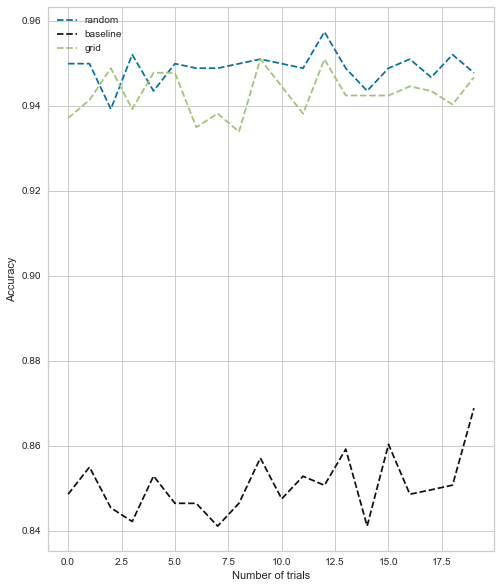

In [120]:
plt.plot(random, '--b', label = 'random')
plt.plot(baseline, '--k', label = 'baseline')
plt.plot(grid, '--g', label = 'grid')
plt.legend(loc = 'best')
plt.xlabel('Number of trials')
plt.ylabel('Accuracy');

### <center>Neural Network Conclusion</center>

Neural Networks provide a wide range of factors to consider when performing the model and this leads towards models that do not necesarilly perform better - although they do sound more fancy. 

In this dataset, the simplicity on how the data was structured and the low amount of features makes the Neural Networl A Neural Network model to perform worse than other models that we have studied during the semester. Consequently, it is important to understand the complexity of the data in order to determine if a Neural Network is necessary - which in this case it clearly is not.

# <center>GENERAL CONCLUSIONS</center>

Throughout the report we set as an objective to study the different models we studied during the Machine Learning course, understand the basic requirements for each model and compare them in terms of their accuracy and explained variance. As we could observe, not all models perform the same and, depending on the type of data, its distribution and objective of the study, different models can be applied. 

In this case, the objective consists of predicting what the price range of different mobile phones will be, based on their attributes. While several models provide promising results, this multi-class classification problem is best addressed via a Logistic Multinomial Regression where, by testing different features to see their impact on the cost-function of the model the classifications obtained are roubst with a high level of accuracy. 

Consequently we decided to use this predictions as our final deliverable due to the reasons explained and the fact that this type of model is the one that best fits the objective of this type of study. 

### Saving the results for Submission

In [121]:
df_test_test = df_test.copy()

In [122]:
scaler = StandardScaler()
df_test_test= scaler.fit_transform(df_test_test)

In [123]:
prices = logreg2.predict(df_test_test)

In [124]:
df_test['price_range'] = prices

In [125]:
df_test.drop(df_test.columns.difference(['price_range']), 1, inplace=True)

In [126]:
df_test.to_csv('Group_H.csv')